In [3]:
import pandas as pd
import matplotlib.pyplot as plt

In [13]:
#read new things
fitbit_survey = pd.read_csv('fitbit_survey.csv')
coach_time = pd.read_excel("D:\\EIC-Code\\00-Python\\2024-08-Objective-identification-on-mental-health_CNN_LSTM\\data\\caoching_time.xlsx")

In [ ]:
#clean the data
fitbit_survey.drop(columns = 'Unnamed: 0', inplace = True) 
coach_time['Health Coach Session'] = pd.to_datetime(coach_time['Health Coach Session']) #format the time
fitbit_survey['date'] = pd.to_datetime(fitbit_survey['date']) #format the time

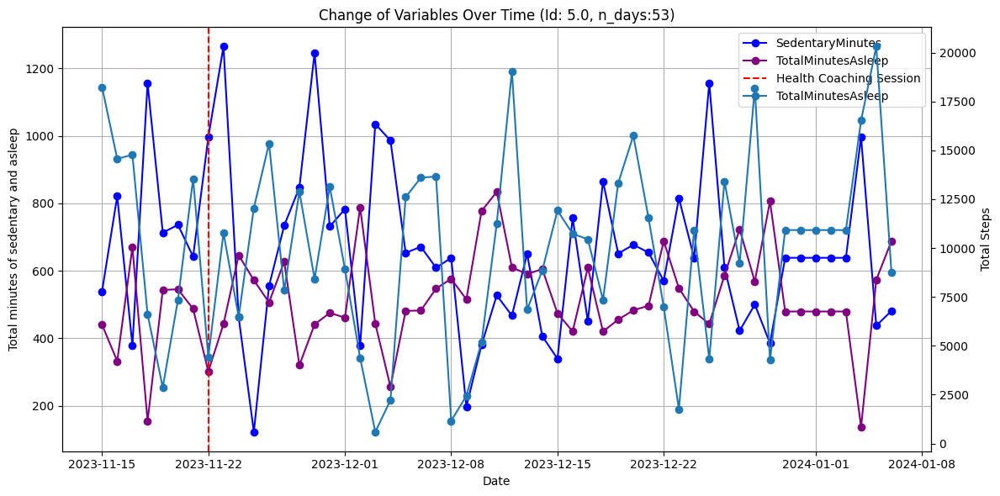

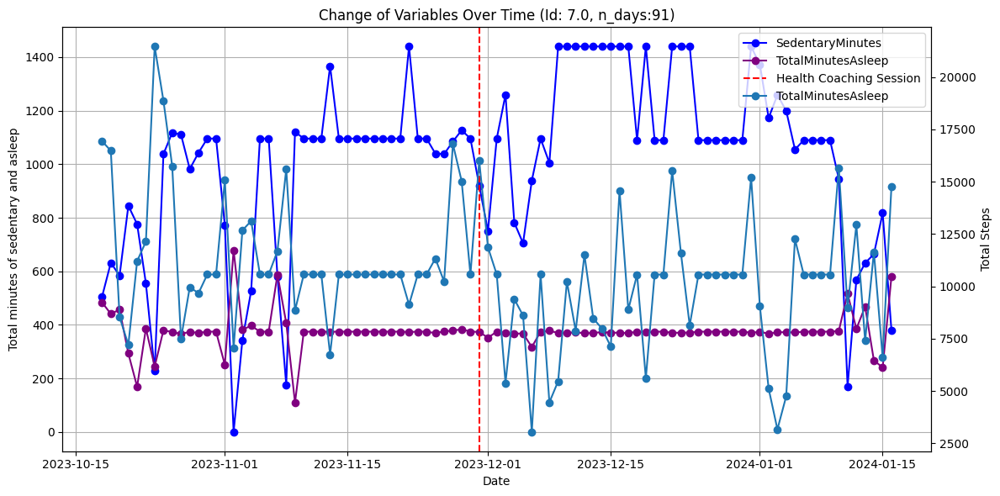

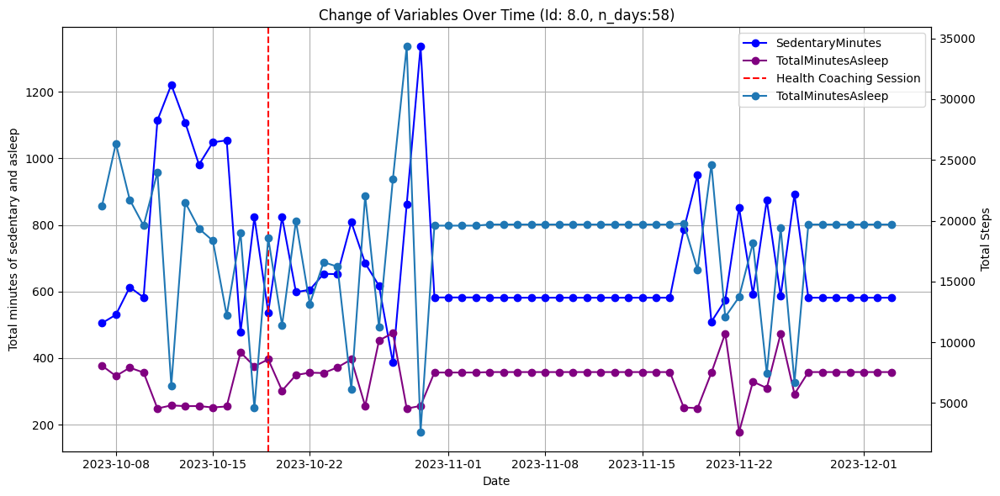

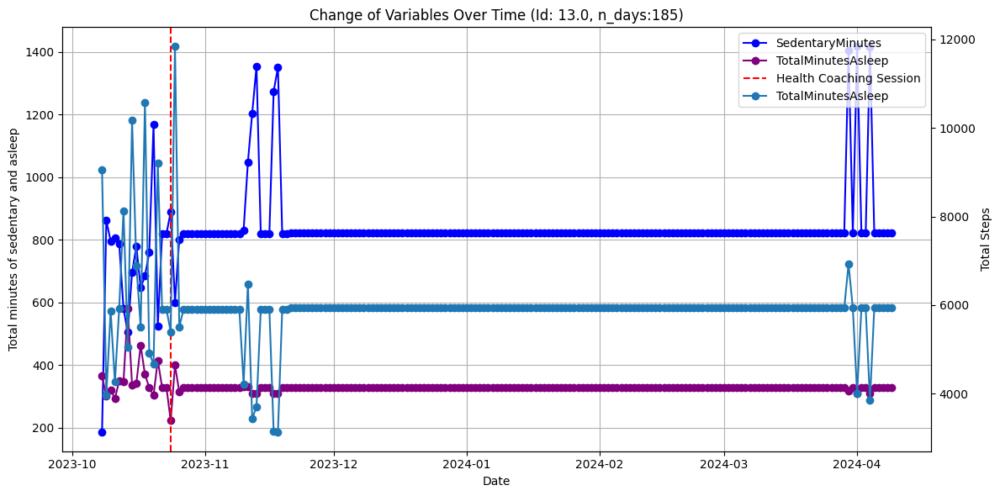

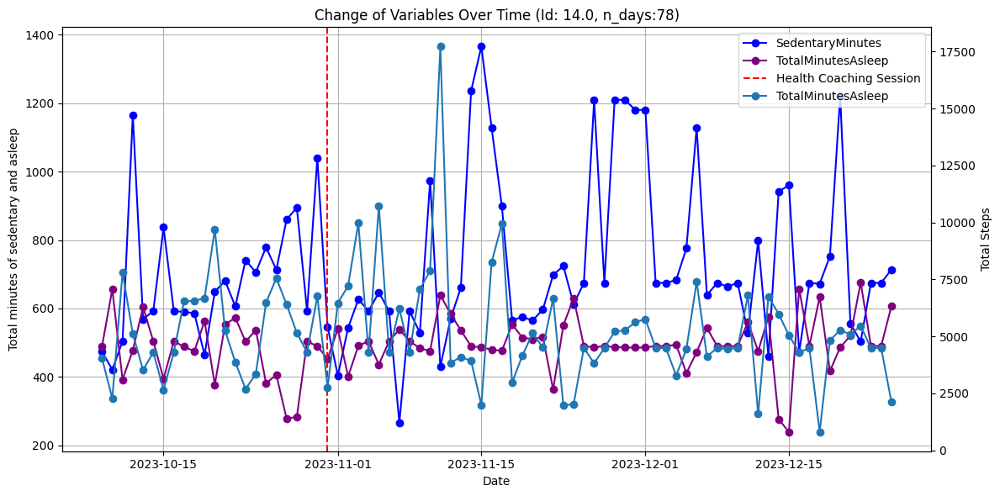

...

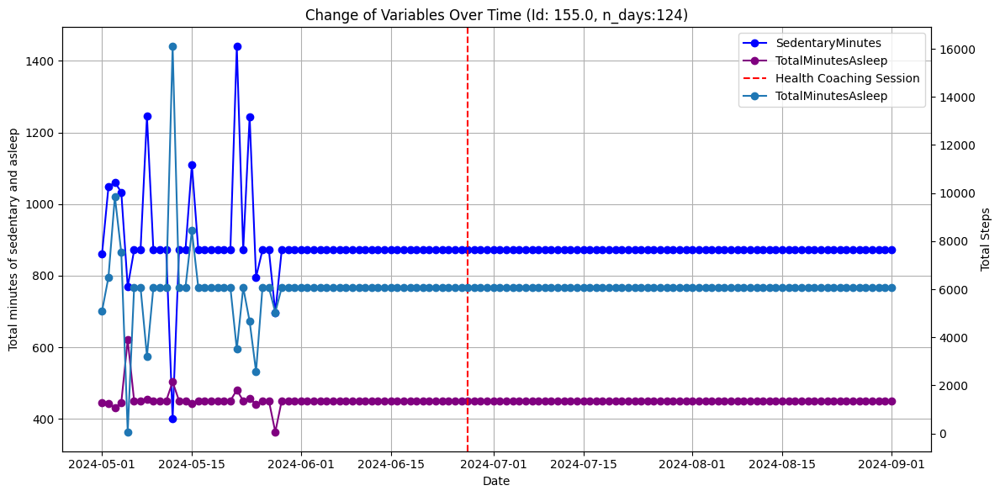

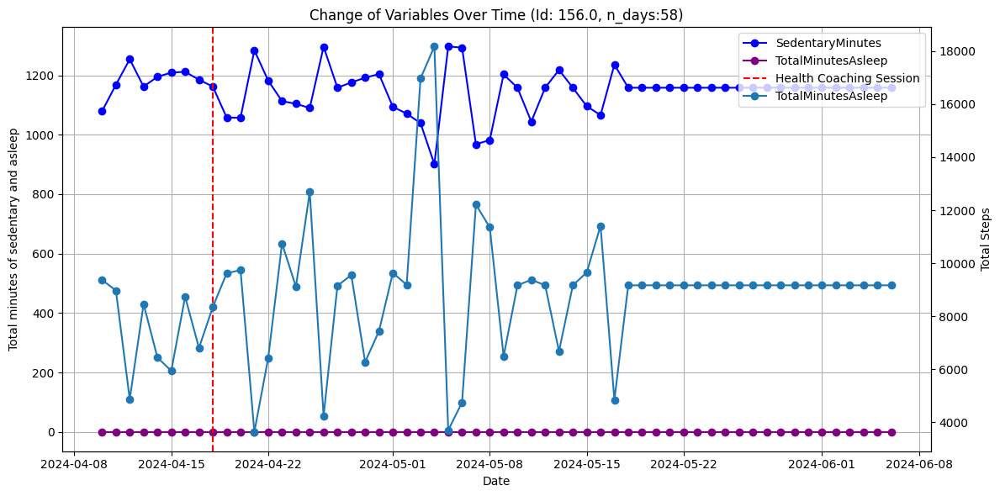

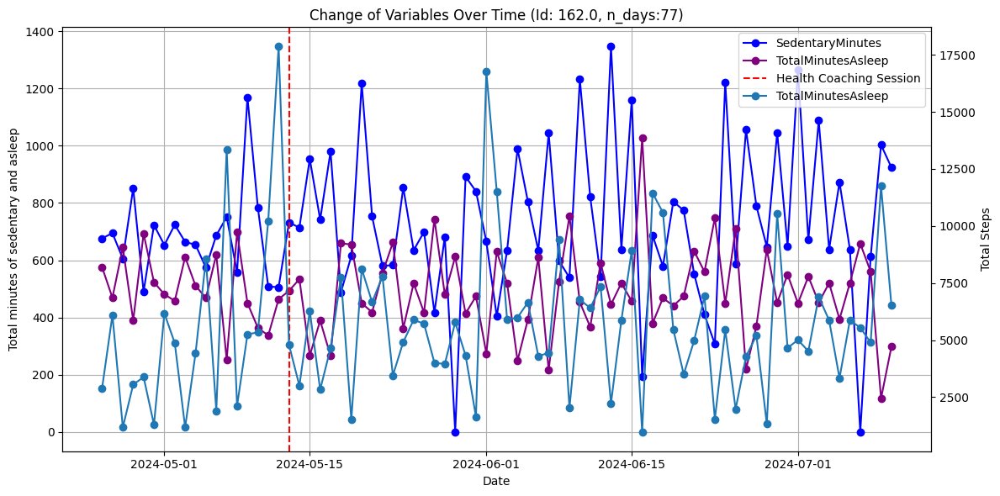

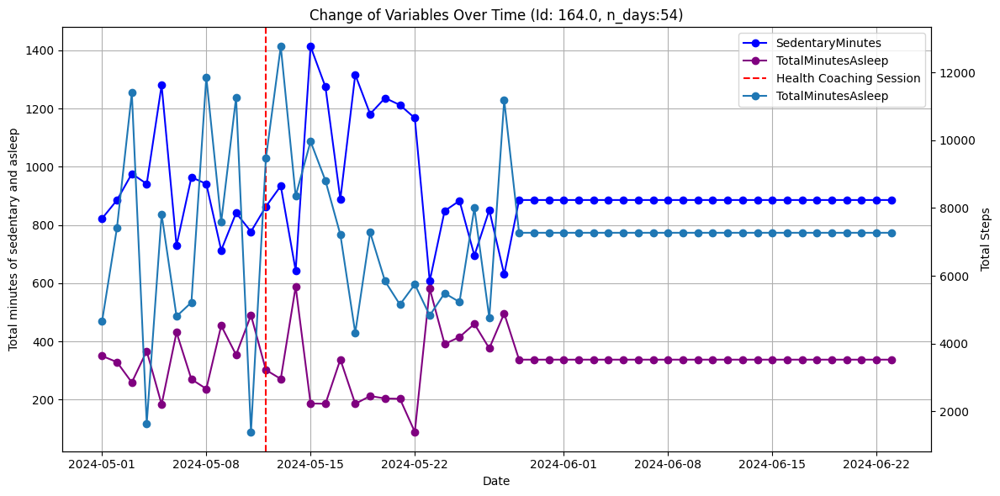

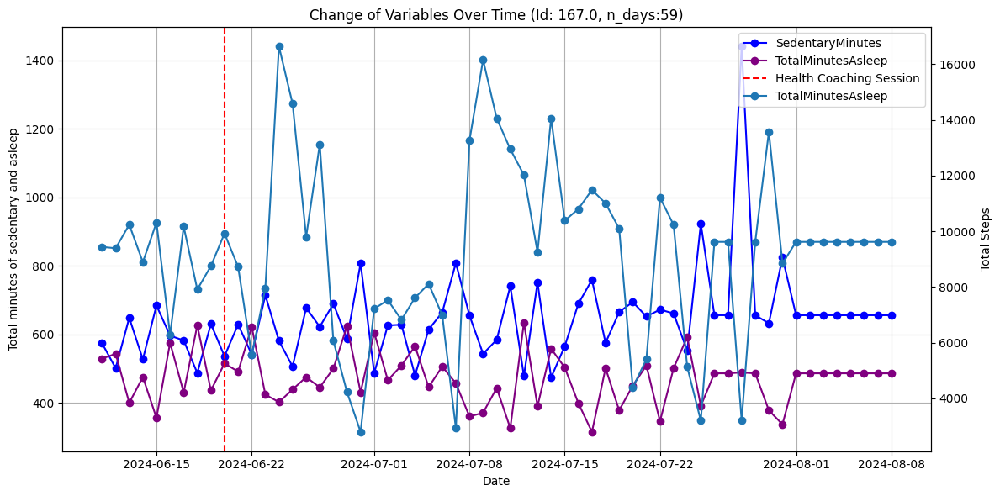

In [25]:
visualize_fitbit = fitbit_survey.copy()

visualize_fitbit.set_index('date', inplace = True)

color_map = {
    "SedentaryMinutes":'blue',
    "TotalMinutesAsleep":'purple'
}

Ids = visualize_fitbit['Id'].unique()
for id in Ids:
    individual_data = visualize_fitbit[visualize_fitbit['Id'] == id]
    n_days = len(individual_data)
    variables = ['SedentaryMinutes', 'TotalMinutesAsleep'] #'TotalSteps', 

    # Plot all variables in a single figure
    fig, ax1 =  plt.subplots(figsize=(12, 6))

    for variable in variables:
        ax1.plot(individual_data.index, individual_data[variable], marker='o', linestyle='-', color = color_map[variable], label=variable)
    
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Total minutes of sedentary and asleep')
    ax1.tick_params(axis = 'y', labelcolor = 'black')


    # Add a vertical line, marker, and annotation for the coaching session date
    individual_coach_time = coach_time[coach_time['ID'] == id]['Health Coach Session'].iloc[0]
    ax1.axvline(individual_coach_time, color='red', linestyle='--', label='Health Coaching Session')
    
    ax2 = ax1.twinx()
    ax2.plot(individual_data.index, individual_data['TotalSteps'], marker='o', linestyle='-', label=variable)
    ax2.set_ylabel('Total Steps', color='black')
    ax2.tick_params(axis='y', labelcolor='black')

    # Add title and grid
    plt.title(f'Change of Variables Over Time (Id: {id}, n_days:{n_days})')
    ax1.grid(True)

    # Combine legends from both axes
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

    # Display the plot
    plt.tight_layout()
    plt.show()